# **Análisis Cluster**
El análisis cluster, o análisis de conglomerados, es una técnica estadística multivariante, cuyo objetivo es agrupar los elementos o variables análizadas en distintos grupos (clusters) en función de la homogeneidad existente entre ellas. 

El análisis cluster engloba distintos métodos, en nuestro ejemplo nos centraremos en el método K-means. El método **K-means** agrupa los elementos o variables analizadas en un número de clusters ya predeterminado. 

Para llevar a cabo nuestro ejemplo, escogeremos el dataset **VarCovid**, elaborado a partir de los datos publicados por el INE. En él encontramos los datos relativos a las tres primeras olas de COVID en las distintas Comunidades Autónomas. 

Realizado por: Abel Carretero Novillo 

## **K-means**

###**Carga de librerias y datos**
Cargamos las librerias que vamos a utilizar en el modelo.

In [81]:
# Preparación de los datos 
import numpy as np
import pandas as pd

# Modelado 
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.preprocessing import scale

# Visualización
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Animación de gráficos
from IPython.display import Image
from matplotlib import animation

In [82]:
# Para poder visualizar nuestro gráfico rotatorio en 3D
# actualizar el SO e instalar el codec de imagenes
%%capture
!apt-get update
!apt install imagemagick

Subimos a Colab el archivo que vamos a utilizar, en nuestro caso es **VarCovid** 

In [83]:
from google.colab import files
uploaded = files.upload()

Saving VarCovid.xlsx to VarCovid (4).xlsx


Visualizamos los datos del archivo que acabamos de cargar.

In [84]:
datos=pd.read_excel('VarCovid.xlsx')
datos.head()

,ccaa,2020SM20,2020SM53,1Ola,2Ola,3Ola
0,Total nacional,26.02,19.98,76.975364,18.564191,25.327608
1,Andalucía,4.49,12.76,16.674314,21.894934,27.770142
2,Aragón,22.26,23.98,57.469077,41.535777,21.928328
3,"Asturias, Principado de",9.84,14.74,25.629173,22.050772,20.941040
4,"Balears, Illes",1.88,9.06,16.572808,15.243648,23.073147


Creamos las diferentes variables que vamos a utilizar. En este caso, en la variable columnas, seleccionaremos la tasa de variación del exceso de mortalidad de la primera ola y segunda ola. Después, la lista que acabamos de crear, la convertimos en un DataFrame (resultado). Además, también tenemos nuestra serie con las Comunidades Autónomas.

In [85]:
columnas = ["1Ola", "2Ola"]
resultado = datos[columnas]
comunidades = datos["ccaa"]


###**Método Elbow**
Para ver el número de cluster adecuado, aplicaremos el **método Elbow** o método del codo, en el cual medimos la distancia promedia de todos los puntos del cluster y su centroide, a través de la suma de sus cuadrados, con el objetivo de minimizar la varianza intra-cluster y maximizar de la varianza inter-cluster. 

Para calcularlo matemáticamente, nos situamos en el gráfico, donde tenemos en el eje x el número de cluster utilizados y en el eje y la suma de los cuadrados intra-cluster (dentro del cluster). Trazamos una línea entre los puntos calculados entre el primer y el último cluster, ese punto óptimo, en el que hay una mayor homogeneidad dentro del cluster y una mayor diferencia entre los cluster, es el punto más distante con la línea trazada. Dado que tenemos 20 variables, creemos conveniente encoger que los cluster se sitúen entre 1 y 10, ya que el punto más alejado se encontrará ahí, en 20 la distancia es 0. 

Para calcular la distancia de cada punto a la línea trazada se utiliza la siguiente fórmula:  

$$D[(P_0,P_1),(x,y)] = \frac{|(y_1-y_0)x-(x_1-x_0)y+x_1y_o-y_1x_0|}{\sqrt{(y_1-y_0)^2+(x_1-x_0)^2}}$$  

Para calcularlo en nuestro código, utilizaremos nuestra lista inercia[ ],que contiene la suma de cuadrados dentro de los cluster y nos delvolverá el número optimo de cluster.


El número óptimo de clusters es:  4 



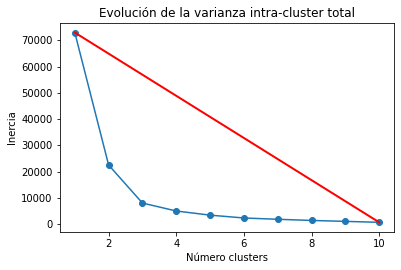

In [86]:
range_clusters = range(1, 11)
inercia = []

for i in range_clusters:
    modelo = KMeans(
                        n_clusters   = i, 
                        n_init       = 20, 
                        random_state = 50
                     )
    modelo.fit(resultado)
    inercia.append(modelo.inertia_)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_clusters, inercia, marker='o')
ax.set_title("Evolución de la varianza intra-cluster total")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Inercia')

# Trazamos la línea
x0, y0 = 1, inercia[0]
x1, y1 = 10, inercia[len(inercia)-1]
ax.plot([x0, x1], [y0, y1], color='red', linewidth=2)

# Determinamos las distancias desde cada punto x, y a la recta P_0-P_1
distancias = []
for i in range(len(inercia)):
  x = i+2
  y = inercia[i]
  numerador = abs((y1-y0)*x - (x1-x0)*y + x1*y0 - y1*x0)
  denominador = np.sqrt((y1 - y0)**2 + (x1 - x0)**2)
  distancias.append(numerador/denominador)
print('\nEl número óptimo de clusters es: ', distancias.index(max(distancias)) + 2, '\n')

Vamos a escalar el modelo, ya que hay grandes diferencias entre las tasas de la primera y segunda ola, así tendremos nuestros datos dentro de un rango dado, como posteriormente veremos gráficamente. Además, creamos los **cluster**, en nuestro caso vamos a escoger 4 cluster. En este caso utilizamos fit() para ajustar el modelo a los datos que hemos cargado y el método predict() para realizar predicciones. 

In [87]:
resultado_escalado = scale(resultado)
modelo = KMeans(n_clusters=4)
modelo.fit(resultado_escalado)
grupos = modelo.predict(resultado_escalado)

Una vez creados los cluster, los relacionamos con nuestra variable comunidades que contiene las Comunidades Autonomas. 

In [88]:
clusters=pd.concat([comunidades,pd.DataFrame(grupos)],axis=1)
clusters.rename(columns={"ccaa":"Comunidades Autónomas",0:"Cluster"},inplace=True)
clusters

,Comunidades Autónomas,Cluster
0,Total nacional,1
1,Andalucía,1
2,Aragón,3
3,"Asturias, Principado de",1
4,"Balears, Illes",0
5,Canarias,0
6,Cantabria,0
7,Castilla y León,1
8,Castilla - La Mancha,2
9,Cataluña,2


###**Representación gráfica**
Vamos a visualizar nuestro modelo, para ello, definimos la función que vamos a llevar a cabo, en este caso situación. En nuestro gráfico de dispersión tendremos dos parametros, x e y, que serán los datos escogidos, c que es el color que le vamos a dar a los datos y s el tamaño de la forma en la que se presenta el dato (marker). 

Además, introducimos unos centroides que se situaran en el centro de cada cluster. 

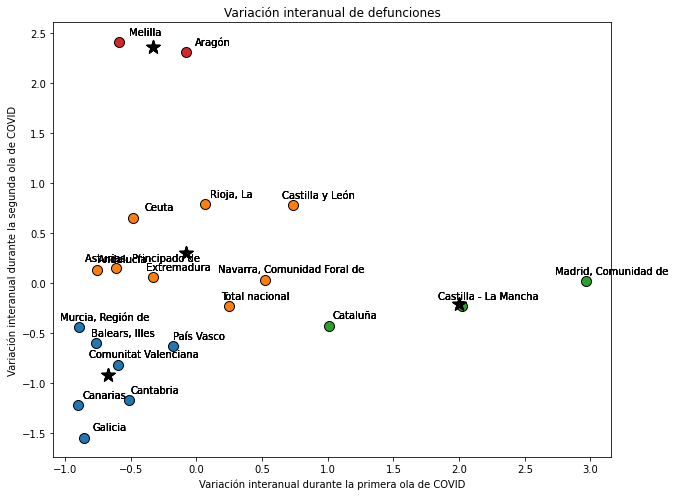

In [89]:
def situacion (x, y, z):
  fig, ax = plt.subplots()
  for i in np.unique(grupos):
    ax.scatter(
        x = resultado_escalado[grupos == i, 0],
        y = resultado_escalado[grupos == i, 1], 
        c = plt.rcParams['axes.prop_cycle'].by_key()['color'][i],
        s=100,
        marker    = 'o',
        edgecolor = 'black', 
        label= f'Cluster {i}'
    )
    for i in range(20):       
       ax.text(x[i]+0.2,y[i]+0.1, z[i], color = 'black', ha = 'center', va = 'center')
    ax.set_title('Variación interanual de defunciones')
    ax.set_xlabel('Variación interanual durante la primera ola de COVID')
    ax.set_ylabel('Variación interanual durante la segunda ola de COVID')
    ax.scatter(
    x = modelo.cluster_centers_[:,0],
    y = modelo.cluster_centers_[:,1], 
    c = 'black',
    s = 200,
    marker = '*',
    label  = 'centroides'
  )
  fig.set_figheight(8)
  fig.set_figwidth(10)
  fig.show()
situacion(resultado_escalado[:,0],resultado_escalado[:,1],comunidades)

El gráfico nos muestra la agrupación de las CCAA en los diferentes clusters. El cluster 0 (color naranja) se corresponde con las CCAA que han tenido una variación de defunciones parecida en ambas olas. El cluster 1 (color azul) nos muestra a las comunidades donde la segunda ola ha tenido un mayor impacto en el exceso de fallecidos. El cluster 2 (color verde), al contrario que en el cluster anterior, corresponde a las que han tenido un mayor exceso en la primera ola de COVID. Por último, el cluster 3 (color rojo) corresponde a las comunidades que presentan un menor exceso de fallecidos en ambas olas. 

###**Análisis tridimensional**
Ahora vamos a introducir una nueva variable y son los datos de la tasa de variación de la tercera ola.

In [90]:
datos=pd.read_excel('VarCovid.xlsx')
datos.head()

,ccaa,2020SM20,2020SM53,1Ola,2Ola,3Ola
0,Total nacional,26.02,19.98,76.975364,18.564191,25.327608
1,Andalucía,4.49,12.76,16.674314,21.894934,27.770142
2,Aragón,22.26,23.98,57.469077,41.535777,21.928328
3,"Asturias, Principado de",9.84,14.74,25.629173,22.050772,20.941040
4,"Balears, Illes",1.88,9.06,16.572808,15.243648,23.073147


In [91]:
columnas = ["1Ola", "2Ola","3Ola"]
resultado = datos[columnas]
comunidades = datos["ccaa"]

####**Gráfico 3D**
Para visualizar nuestra 3 variables, vamos a introducir una serie de cambios. En este caso volvemos a escalar el modelo para que nuestros resultados se enmarquen dentro de un rango. La C corresponderan a los centroides del modelo y le asignamos colores a nuestros 4 clusters. 
Para poder visualizar nuestras 3 variables lo haremos a través de un gráfico tridimensional, para ello necesitamos cargar Axes3D, trazaremos nuestros puntos y le aplicamos la función de rotación para oder visualizar mejor los puntos en los 3 ejes.

In [92]:
# Eliminamos la salida gráfica de esta celda de codigo
# para que nos salga un gráfico estático duplicado
%%capture

# Escalar y estimar el modelo 
resultado_escalado = scale(resultado)
modelo = KMeans(n_clusters=4)
modelo.fit(resultado_escalado)
labels = modelo.predict(resultado_escalado)

# Centroides
C = modelo.cluster_centers_

# Asignar colores a los clusters
colores=['red','green','blue','orange']
asignar=[]
for row in labels:
    asignar.append(colores[row])

# Crear elemento de visualización
fig = plt.figure()
ax = Axes3D(fig)
ax.set_title('Variación interanual de defunciones')
ax.set_xlabel('Primera ola de COVID')
ax.set_ylabel('Segunda ola de COVID')
ax.set_zlabel('Tercera ola de COVID')

# Trazar y anotar punto a punto
for i in range(len(resultado_escalado)): 
  x = resultado_escalado[i,0]
  y = resultado_escalado[i,1]
  z = resultado_escalado[i,2]
  label = comunidades[i]
  ax.scatter(x, y, z, color=asignar[i])
  ax.text(x, y , z, 
          '%s' % (label), 
          size=10, 
          zorder=1, 
          color=asignar[i], 
          alpha=.75)

# Añadimos los centroides 
ax.scatter(C[:, 0], C[:, 1], C[:, 2], marker='*', c=colores, s=100)

# Le aplicamos la rotacion
def rotar(angulo):
    ax.view_init(azim=angulo)

rotacion= animation.FuncAnimation(fig, rotar, frames=np.arange(0,360,2),interval=100)

rotacion.save('rotation.gif', dpi=80, writer='imagemagick')


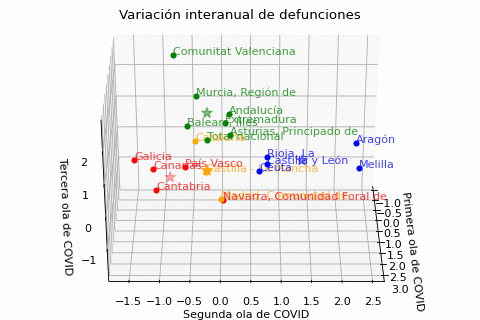

In [93]:
# Abrir gráfico animado
Image(open('/content/rotation.gif', 'rb').read())

Mostramos la posición de los centroides para comprender mejor como se agrupan las CCAA en los clusters.

In [94]:
centroides = pd.DataFrame(C, columns=['Primera ola', 'Segunda ola', 'Tercera ola'], index=range(4))
centroides.index.name = "Cluster"
centroides

,Primera ola,Segunda ola,Tercera ola
Cluster,,,
0,-0.386850,-0.907279,-1.159663
1,-0.530356,-0.251244,0.844556
2,-0.069693,1.387951,-0.398835
3,1.998403,-0.214884,0.626865


In [95]:
clusters=pd.concat([comunidades,pd.DataFrame(labels)],axis=1)
clusters.rename(columns={"ccaa":"Comunidades Autónomas",0:"Cluster"},inplace=True)
clusters

,Comunidades Autónomas,Cluster
0,Total nacional,1
1,Andalucía,1
2,Aragón,2
3,"Asturias, Principado de",1
4,"Balears, Illes",1
5,Canarias,0
6,Cantabria,0
7,Castilla y León,2
8,Castilla - La Mancha,3
9,Cataluña,3


Dadas las diferencias entre las distintas CCAA, los centroides muestran resultados que se homogenizan bastante, tal vez sería conveniente añadir algún cluster más. A pesar de ello, podemos extraer que en el cluster 0 presenta un mayor déficit de fallecidos en la segunda ola y en el cluster 3 la presenta en la primera ola. 